In [34]:
import pandas as pd
import numpy as np
import statistics as st
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from collections import Counter
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import LabelEncoder
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import cross_val_predict
from sklearn import metrics
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
from sklearn.model_selection import cross_val_score
from sklearn import svm
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import GridSearchCV
from pylab import savefig



In [35]:
red_wine = pd.read_csv(r'C:\Users\Sheikh Nabil\Anaconda\Desktop\wine-project\Data Set\winequality-red.csv', sep = ';')
white_wine = pd.read_csv(r'C:\Users\Sheikh Nabil\Anaconda\Desktop\wine-project\Data Set\winequality-white.csv', sep = ';')

red_wine['Wine Type'] = 'Red'
white_wine['Wine Ttype'] = 'White'

red_wine['quality_label'] = red_wine['quality'].apply(lambda value:'Low' if value  <=6 else 'Medium' if value <= 8 else 'High')

red_wine['quality_label'] = pd.Categorical(red_wine['quality_label'], categories=['Low','Medium','High'])


white_wine['quality_label'] = white_wine['quality'].apply(lambda value: 'Low' if value <= 6 else 'Medium' if value <= 8 else 'High')

white_wine['quality_label'] = pd.Categorical(white_wine['quality_label'], categories= ['Low', 'Medium' , 'High'])

wines = pd.concat([red_wine,white_wine])

In [36]:
sales_data = pd.read_csv(r"C:\Users\Sheikh Nabil\Anaconda\Desktop\wine-project\Data Set\wine_sales_data.csv")

In [37]:
wines

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,Wine Type,quality_label,Wine Ttype
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5,Red,Low,NaN
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.99680,3.20,0.68,9.8,5,Red,Low,NaN
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.99700,3.26,0.65,9.8,5,Red,Low,NaN
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.99800,3.16,0.58,9.8,6,Red,Low,NaN
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5,Red,Low,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4893,6.2,0.21,0.29,1.6,0.039,24.0,92.0,0.99114,3.27,0.50,11.2,6,NaN,Low,White
4894,6.6,0.32,0.36,8.0,0.047,57.0,168.0,0.99490,3.15,0.46,9.6,5,NaN,Low,White
4895,6.5,0.24,0.19,1.2,0.041,30.0,111.0,0.99254,2.99,0.46,9.4,6,NaN,Low,White
4896,5.5,0.29,0.30,1.1,0.022,20.0,110.0,0.98869,3.34,0.38,12.8,7,NaN,Medium,White


In [38]:
sum_column = wines["fixed acidity"] + wines["volatile acidity"] + wines['citric acid']
wines["Total Acidity"] = sum_column
wines

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,Wine Type,quality_label,Wine Ttype,Total Acidity
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5,Red,Low,NaN,8.10
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.99680,3.20,0.68,9.8,5,Red,Low,NaN,8.68
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.99700,3.26,0.65,9.8,5,Red,Low,NaN,8.60
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.99800,3.16,0.58,9.8,6,Red,Low,NaN,12.04
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5,Red,Low,NaN,8.10
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4893,6.2,0.21,0.29,1.6,0.039,24.0,92.0,0.99114,3.27,0.50,11.2,6,NaN,Low,White,6.70
4894,6.6,0.32,0.36,8.0,0.047,57.0,168.0,0.99490,3.15,0.46,9.6,5,NaN,Low,White,7.28
4895,6.5,0.24,0.19,1.2,0.041,30.0,111.0,0.99254,2.99,0.46,9.4,6,NaN,Low,White,6.93
4896,5.5,0.29,0.30,1.1,0.022,20.0,110.0,0.98869,3.34,0.38,12.8,7,NaN,Medium,White,6.09


In [39]:
new_column = wines['residual sugar'] / wines['Total Acidity']
wines['S.A.Ratio'] = new_column
wines

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,Wine Type,quality_label,Wine Ttype,Total Acidity,S.A.Ratio
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5,Red,Low,NaN,8.10,0.234568
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.99680,3.20,0.68,9.8,5,Red,Low,NaN,8.68,0.299539
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.99700,3.26,0.65,9.8,5,Red,Low,NaN,8.60,0.267442
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.99800,3.16,0.58,9.8,6,Red,Low,NaN,12.04,0.157807
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5,Red,Low,NaN,8.10,0.234568
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4893,6.2,0.21,0.29,1.6,0.039,24.0,92.0,0.99114,3.27,0.50,11.2,6,NaN,Low,White,6.70,0.238806
4894,6.6,0.32,0.36,8.0,0.047,57.0,168.0,0.99490,3.15,0.46,9.6,5,NaN,Low,White,7.28,1.098901
4895,6.5,0.24,0.19,1.2,0.041,30.0,111.0,0.99254,2.99,0.46,9.4,6,NaN,Low,White,6.93,0.173160
4896,5.5,0.29,0.30,1.1,0.022,20.0,110.0,0.98869,3.34,0.38,12.8,7,NaN,Medium,White,6.09,0.180624


In [40]:
wines['Taste'] = wines['S.A.Ratio'].apply(lambda value: 'Dry' if  value <= 2 else 'Sweet')
wines

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,Wine Type,quality_label,Wine Ttype,Total Acidity,S.A.Ratio,Taste
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5,Red,Low,NaN,8.10,0.234568,Dry
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.99680,3.20,0.68,9.8,5,Red,Low,NaN,8.68,0.299539,Dry
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.99700,3.26,0.65,9.8,5,Red,Low,NaN,8.60,0.267442,Dry
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.99800,3.16,0.58,9.8,6,Red,Low,NaN,12.04,0.157807,Dry
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5,Red,Low,NaN,8.10,0.234568,Dry
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4893,6.2,0.21,0.29,1.6,0.039,24.0,92.0,0.99114,3.27,0.50,11.2,6,NaN,Low,White,6.70,0.238806,Dry
4894,6.6,0.32,0.36,8.0,0.047,57.0,168.0,0.99490,3.15,0.46,9.6,5,NaN,Low,White,7.28,1.098901,Dry
4895,6.5,0.24,0.19,1.2,0.041,30.0,111.0,0.99254,2.99,0.46,9.4,6,NaN,Low,White,6.93,0.173160,Dry
4896,5.5,0.29,0.30,1.1,0.022,20.0,110.0,0.98869,3.34,0.38,12.8,7,NaN,Medium,White,6.09,0.180624,Dry


In [41]:
wines = wines.rename(columns={"density": "Density", "alcohol": "Alcohol", 'quality' : 'Quality', 'wine_type' : 'Wine Type' , 'quality_label': 'Quality Label'})
wines

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,Density,pH,sulphates,Alcohol,Quality,Wine Type,Quality Label,Wine Ttype,Total Acidity,S.A.Ratio,Taste
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5,Red,Low,NaN,8.10,0.234568,Dry
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.99680,3.20,0.68,9.8,5,Red,Low,NaN,8.68,0.299539,Dry
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.99700,3.26,0.65,9.8,5,Red,Low,NaN,8.60,0.267442,Dry
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.99800,3.16,0.58,9.8,6,Red,Low,NaN,12.04,0.157807,Dry
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5,Red,Low,NaN,8.10,0.234568,Dry
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4893,6.2,0.21,0.29,1.6,0.039,24.0,92.0,0.99114,3.27,0.50,11.2,6,NaN,Low,White,6.70,0.238806,Dry
4894,6.6,0.32,0.36,8.0,0.047,57.0,168.0,0.99490,3.15,0.46,9.6,5,NaN,Low,White,7.28,1.098901,Dry
4895,6.5,0.24,0.19,1.2,0.041,30.0,111.0,0.99254,2.99,0.46,9.4,6,NaN,Low,White,6.93,0.173160,Dry
4896,5.5,0.29,0.30,1.1,0.022,20.0,110.0,0.98869,3.34,0.38,12.8,7,NaN,Medium,White,6.09,0.180624,Dry


In [42]:
wines.describe()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,Density,pH,sulphates,Alcohol,Quality,Total Acidity,S.A.Ratio
count,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000
mean,7.215307,0.339666,0.318633,5.443235,0.056034,30.525319,115.744574,0.994697,3.218501,0.531268,10.491801,5.818378,7.873606,0.716897
std,1.296434,0.164636,0.145318,4.757804,0.035034,17.749400,56.521855,0.002999,0.160787,0.148806,1.192712,0.873255,1.388024,0.640924
min,3.800000,0.080000,0.000000,0.600000,0.009000,1.000000,6.000000,0.987110,2.720000,0.220000,8.000000,3.000000,4.130000,0.064586
25%,6.400000,0.230000,0.250000,1.800000,0.038000,17.000000,77.000000,0.992340,3.110000,0.430000,9.500000,5.000000,7.020000,0.222222
50%,7.000000,0.290000,0.310000,3.000000,0.047000,29.000000,118.000000,0.994890,3.210000,0.510000,10.300000,6.000000,7.600000,0.381679
75%,7.700000,0.400000,0.390000,8.100000,0.065000,41.000000,156.000000,0.996990,3.320000,0.600000,11.300000,6.000000,8.380000,1.094675
max,15.900000,1.580000,1.660000,65.800000,0.611000,289.000000,440.000000,1.038980,4.010000,2.000000,14.900000,9.000000,17.045000,7.026161


In [43]:
# The relation between total acidity and Red Wine quality label is positive. 

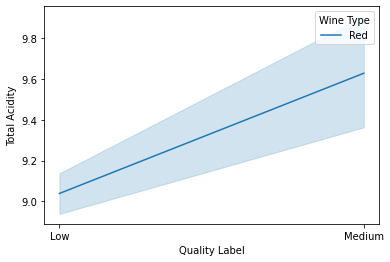

In [44]:
sns.lineplot(data=wines, x="Quality Label", y="Total Acidity", hue= 'Wine Type');

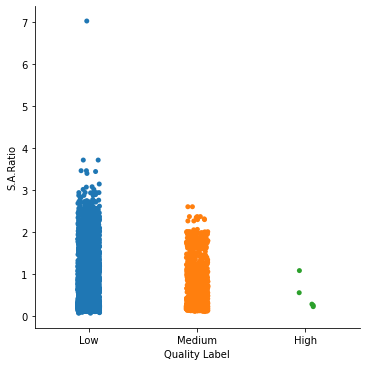

In [45]:
sns.catplot(x="Quality Label", y="S.A.Ratio", data=wines, ci= None)

In [ ]:
# Total sulfur dioxide is slightly higher on white wine than red wine, This measure is for all the wine classes. 

In [65]:
wines['taste'].value_counts()

dry             4633
medium dry      1533
medium sweet     330
sweet              1
Name: taste, dtype: int64

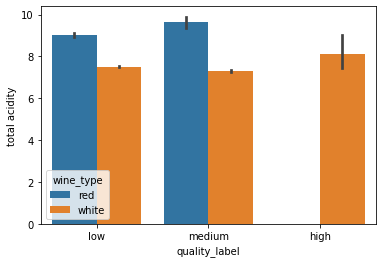

In [37]:
sns.barplot(x=wines['quality_label'], y=wines['total acidity'], hue=wines['wine_type'])

In [ ]:
# Red wine is has more total acidic compound than white wine. For the high quality red wine the total number of red wine data is proportionately 
# very low than whit wine. For this reason here is no high quality red wine are shown.  

In [38]:
sales_data.head(100)

,Unnamed: 0,country,description,designation,points,price,province,region_1,region_2,variety,winery
0,0,US,This tremendous 100% varietal wine hails from ...,Martha's Vineyard,96,235.0,California,Napa Valley,Napa,Cabernet Sauvignon,Heitz
1,1,Spain,"Ripe aromas of fig, blackberry and cassis are ...",Carodorum Selección Especial Reserva,96,110.0,Northern Spain,Toro,NaN,Tinta de Toro,Bodega Carmen Rodríguez
2,2,US,Mac Watson honors the memory of a wine once ma...,Special Selected Late Harvest,96,90.0,California,Knights Valley,Sonoma,Sauvignon Blanc,Macauley
3,3,US,"This spent 20 months in 30% new French oak, an...",Reserve,96,65.0,Oregon,Willamette Valley,Willamette Valley,Pinot Noir,Ponzi
4,4,France,"This is the top wine from La Bégude, named aft...",La Brûlade,95,66.0,Provence,Bandol,NaN,Provence red blend,Domaine de la Bégude
...,...,...,...,...,...,...,...,...,...,...,...
95,95,France,"This is a smooth, soft wine that is full of bl...",Château Beauvillain-Monpezat,86,14.0,Southwest France,Cahors,NaN,Malbec-Merlot,Rigal
96,96,US,This is an easygoing wine that's neither too o...,NaN,86,18.0,California,California,California Other,Chardonnay,The Naked Grape
97,97,US,"Blended with small amounts of Merlot, Cabernet...",NaN,86,36.0,California,Sonoma Valley,Sonoma,Cabernet Sauvignon,Tin Barn
98,98,France,"Closer to Bordeaux than is Cahors, this is Mal...",Pigmentum,86,15.0,Southwest France,Buzet,NaN,Merlot-Malbec,Georges Vigouroux


In [12]:
sales_data.fillna(sales_data['price'].mean())

,Unnamed: 0,country,description,designation,points,price,province,region_1,region_2,variety,winery
0,0,US,This tremendous 100% varietal wine hails from ...,Martha's Vineyard,96,235.0,California,Napa Valley,Napa,Cabernet Sauvignon,Heitz
1,1,Spain,"Ripe aromas of fig, blackberry and cassis are ...",Carodorum Selección Especial Reserva,96,110.0,Northern Spain,Toro,33.1315,Tinta de Toro,Bodega Carmen Rodríguez
2,2,US,Mac Watson honors the memory of a wine once ma...,Special Selected Late Harvest,96,90.0,California,Knights Valley,Sonoma,Sauvignon Blanc,Macauley
3,3,US,"This spent 20 months in 30% new French oak, an...",Reserve,96,65.0,Oregon,Willamette Valley,Willamette Valley,Pinot Noir,Ponzi
4,4,France,"This is the top wine from La Bégude, named aft...",La Brûlade,95,66.0,Provence,Bandol,33.1315,Provence red blend,Domaine de la Bégude
...,...,...,...,...,...,...,...,...,...,...,...
150925,150925,Italy,Many people feel Fiano represents southern Ita...,33.1315,91,20.0,Southern Italy,Fiano di Avellino,33.1315,White Blend,Feudi di San Gregorio
150926,150926,France,"Offers an intriguing nose with ginger, lime an...",Cuvée Prestige,91,27.0,Champagne,Champagne,33.1315,Champagne Blend,H.Germain
150927,150927,Italy,This classic example comes from a cru vineyard...,Terre di Dora,91,20.0,Southern Italy,Fiano di Avellino,33.1315,White Blend,Terredora
150928,150928,France,"A perfect salmon shade, with scents of peaches...",Grand Brut Rosé,90,52.0,Champagne,Champagne,33.1315,Champagne Blend,Gosset


In [40]:
sales_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 150930 entries, 0 to 150929
Data columns (total 11 columns):
 #   Column       Non-Null Count   Dtype  
---  ------       --------------   -----  
 0   Unnamed: 0   150930 non-null  int64  
 1   country      150925 non-null  object 
 2   description  150930 non-null  object 
 3   designation  105195 non-null  object 
 4   points       150930 non-null  int64  
 5   price        137235 non-null  float64
 6   province     150925 non-null  object 
 7   region_1     125870 non-null  object 
 8   region_2     60953 non-null   object 
 9   variety      150930 non-null  object 
 10  winery       150930 non-null  object 
dtypes: float64(1), int64(2), object(8)
memory usage: 8.1+ MB


In [41]:
sales_data.isnull().sum()

Unnamed: 0         0
country            5
description        0
designation    45735
points             0
price          13695
province           5
region_1       25060
region_2       89977
variety            0
winery             0
dtype: int64

In [42]:
sales_data

,Unnamed: 0,country,description,designation,points,price,province,region_1,region_2,variety,winery
0,0,US,This tremendous 100% varietal wine hails from ...,Martha's Vineyard,96,235.0,California,Napa Valley,Napa,Cabernet Sauvignon,Heitz
1,1,Spain,"Ripe aromas of fig, blackberry and cassis are ...",Carodorum Selección Especial Reserva,96,110.0,Northern Spain,Toro,NaN,Tinta de Toro,Bodega Carmen Rodríguez
2,2,US,Mac Watson honors the memory of a wine once ma...,Special Selected Late Harvest,96,90.0,California,Knights Valley,Sonoma,Sauvignon Blanc,Macauley
3,3,US,"This spent 20 months in 30% new French oak, an...",Reserve,96,65.0,Oregon,Willamette Valley,Willamette Valley,Pinot Noir,Ponzi
4,4,France,"This is the top wine from La Bégude, named aft...",La Brûlade,95,66.0,Provence,Bandol,NaN,Provence red blend,Domaine de la Bégude
...,...,...,...,...,...,...,...,...,...,...,...
150925,150925,Italy,Many people feel Fiano represents southern Ita...,NaN,91,20.0,Southern Italy,Fiano di Avellino,NaN,White Blend,Feudi di San Gregorio
150926,150926,France,"Offers an intriguing nose with ginger, lime an...",Cuvée Prestige,91,27.0,Champagne,Champagne,NaN,Champagne Blend,H.Germain
150927,150927,Italy,This classic example comes from a cru vineyard...,Terre di Dora,91,20.0,Southern Italy,Fiano di Avellino,NaN,White Blend,Terredora
150928,150928,France,"A perfect salmon shade, with scents of peaches...",Grand Brut Rosé,90,52.0,Champagne,Champagne,NaN,Champagne Blend,Gosset


In [43]:
pl_sales_data = sales_data[(sales_data['country'] == 'Portugal') & (sales_data['province'] == 'Vinho Verde')]

In [44]:
pl_sales_data

,Unnamed: 0,country,description,designation,points,price,province,region_1,region_2,variety,winery
277,277,Portugal,"Pure Alvarinho from the Monção region, it's ri...",Portal do Fidalgo,92,35.0,Vinho Verde,NaN,NaN,Alvarinho,Provam
993,993,Portugal,"With its typical prickle on the tongue, this i...",Campelo,85,10.0,Vinho Verde,NaN,NaN,Portuguese White,Caves Campelo
994,994,Portugal,"Lightly spritzy, this tastes of crisp apple an...",Miranda,85,9.0,Vinho Verde,NaN,NaN,Portuguese White,Caves Campelo
1378,1378,Portugal,Some wood aging has rounded out this fruity wi...,Daphne,91,NaN,Vinho Verde,NaN,NaN,Loureiro,Casal Paço Padreiro
1558,1558,Portugal,This medium-sweet rosé is a familiar style of ...,Campelo,84,10.0,Vinho Verde,NaN,NaN,Rosé,Caves Campelo
...,...,...,...,...,...,...,...,...,...,...,...
141129,141129,Portugal,"A simple, rather earthy, dry style of vinho ve...",NaN,83,9.0,Vinho Verde,NaN,NaN,Portuguese White,Adega Cooperativa Ponte de Lima
141143,141143,Portugal,The estate wine from Vila Verde which is in Lo...,NaN,82,8.0,Vinho Verde,NaN,NaN,Portuguese White,Casa de Vila Verde
141148,141148,Portugal,"The standard style of inexpensive Vinho Verde,...",Gatão,82,6.0,Vinho Verde,NaN,NaN,Portuguese White,Borges
143472,143472,Portugal,"Very nice Vinho Verde, with fresh, green apple...",NaN,86,9.0,Vinho Verde,NaN,NaN,White Blend,Casa de Vila Verde


In [45]:
pl_sales_data.dtypes

Unnamed: 0       int64
country         object
description     object
designation     object
points           int64
price          float64
province        object
region_1        object
region_2        object
variety         object
winery          object
dtype: object

In [46]:
pl_sales_data.isnull().sum()

Unnamed: 0       0
country          0
description      0
designation     95
points           0
price           86
province         0
region_1       396
region_2       396
variety          0
winery           0
dtype: int64

In [47]:
vinho_verde = pl_sales_data.drop(['region_1','region_2','description','Unnamed: 0','designation'],axis=1)

In [48]:
vinho_verde.head(10)

,country,points,price,province,variety,winery
277,Portugal,92,35.0,Vinho Verde,Alvarinho,Provam
993,Portugal,85,10.0,Vinho Verde,Portuguese White,Caves Campelo
994,Portugal,85,9.0,Vinho Verde,Portuguese White,Caves Campelo
1378,Portugal,91,NaN,Vinho Verde,Loureiro,Casal Paço Padreiro
1558,Portugal,84,10.0,Vinho Verde,Rosé,Caves Campelo
1559,Portugal,84,10.0,Vinho Verde,Portuguese White,Caves Campelo
1694,Portugal,88,12.0,Vinho Verde,Portuguese White,Casa de Vila Nova
1841,Portugal,84,10.0,Vinho Verde,Portuguese Red,Caves Campelo
2136,Portugal,82,10.0,Vinho Verde,Portuguese White,Caves Campelo
2565,Portugal,90,NaN,Vinho Verde,Portuguese White,Provam


In [49]:
vinho_verde[vinho_verde['points'] == 84].describe()

,points,price
count,60.0,45.000000
mean,84.0,8.244444
std,0.0,2.133665
min,84.0,5.000000
25%,84.0,7.000000
50%,84.0,8.000000
75%,84.0,9.000000
max,84.0,13.000000


In [50]:
sales_data.describe()

,Unnamed: 0,points,price
count,150930.000000,150930.000000,137235.000000
mean,75464.500000,87.888418,33.131482
std,43569.882402,3.222392,36.322536
min,0.000000,80.000000,4.000000
25%,37732.250000,86.000000,16.000000
50%,75464.500000,88.000000,24.000000
75%,113196.750000,90.000000,40.000000
max,150929.000000,100.000000,2300.000000


In [51]:
vinho_verde.describe()

,points,price
count,396.000000,310.000000
mean,86.409091,11.400000
std,2.491366,4.821205
min,80.000000,5.000000
25%,85.000000,8.000000
50%,86.000000,10.000000
75%,88.000000,13.000000
max,92.000000,45.000000


In [52]:
vinho_verde['points'] = vinho_verde['points'].apply(lambda value:'not good' if value <=86 else 'very good')

In [53]:
wines.head(5)

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,wine_type,quality_label,total acidity,s.r.ratio
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5,red,low,8.10,0.234568
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5,red,low,8.68,0.299539
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5,red,low,8.60,0.267442
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6,red,low,12.04,0.157807
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5,red,low,8.10,0.234568


In [54]:
vinho_verde

,country,points,price,province,variety,winery
277,Portugal,very good,35.0,Vinho Verde,Alvarinho,Provam
993,Portugal,not good,10.0,Vinho Verde,Portuguese White,Caves Campelo
994,Portugal,not good,9.0,Vinho Verde,Portuguese White,Caves Campelo
1378,Portugal,very good,NaN,Vinho Verde,Loureiro,Casal Paço Padreiro
1558,Portugal,not good,10.0,Vinho Verde,Rosé,Caves Campelo
...,...,...,...,...,...,...
141129,Portugal,not good,9.0,Vinho Verde,Portuguese White,Adega Cooperativa Ponte de Lima
141143,Portugal,not good,8.0,Vinho Verde,Portuguese White,Casa de Vila Verde
141148,Portugal,not good,6.0,Vinho Verde,Portuguese White,Borges
143472,Portugal,not good,9.0,Vinho Verde,White Blend,Casa de Vila Verde


In [55]:
vinho_verde.isnull().sum()

country      0
points       0
price       86
province     0
variety      0
winery       0
dtype: int64

In [33]:
plt.figure(figsize = (14,6))
plt.title('Wine prices in diffrent countries')
sns.barplot(x = 'country', y="price", data= z.head(15))
locs, labels = plt.xticks()
plt.show()

NameError: name 'z' is not defined

In [ ]:
# Mostly the central or western european countries sells the most expensive wines. 

In [17]:
new = sales_data.rename(columns={"country": "Country", "points": "Points", "price": "Price", 'province' : 'Province', 'variety' : 'Variety'})
new

,Unnamed: 0,Country,description,designation,Points,Price,Province,region_1,region_2,Variety,winery
0,0,US,This tremendous 100% varietal wine hails from ...,Martha's Vineyard,96,235.0,California,Napa Valley,Napa,Cabernet Sauvignon,Heitz
1,1,Spain,"Ripe aromas of fig, blackberry and cassis are ...",Carodorum Selección Especial Reserva,96,110.0,Northern Spain,Toro,NaN,Tinta de Toro,Bodega Carmen Rodríguez
2,2,US,Mac Watson honors the memory of a wine once ma...,Special Selected Late Harvest,96,90.0,California,Knights Valley,Sonoma,Sauvignon Blanc,Macauley
3,3,US,"This spent 20 months in 30% new French oak, an...",Reserve,96,65.0,Oregon,Willamette Valley,Willamette Valley,Pinot Noir,Ponzi
4,4,France,"This is the top wine from La Bégude, named aft...",La Brûlade,95,66.0,Provence,Bandol,NaN,Provence red blend,Domaine de la Bégude
...,...,...,...,...,...,...,...,...,...,...,...
150925,150925,Italy,Many people feel Fiano represents southern Ita...,NaN,91,20.0,Southern Italy,Fiano di Avellino,NaN,White Blend,Feudi di San Gregorio
150926,150926,France,"Offers an intriguing nose with ginger, lime an...",Cuvée Prestige,91,27.0,Champagne,Champagne,NaN,Champagne Blend,H.Germain
150927,150927,Italy,This classic example comes from a cru vineyard...,Terre di Dora,91,20.0,Southern Italy,Fiano di Avellino,NaN,White Blend,Terredora
150928,150928,France,"A perfect salmon shade, with scents of peaches...",Grand Brut Rosé,90,52.0,Champagne,Champagne,NaN,Champagne Blend,Gosset


In [18]:
data = sales_data['country'].value_counts(ascending= False)
data

US                        62397
Italy                     23478
France                    21098
Spain                      8268
Chile                      5816
Argentina                  5631
Portugal                   5322
Australia                  4957
New Zealand                3320
Austria                    3057
Germany                    2452
South Africa               2258
Greece                      884
Israel                      630
Hungary                     231
Canada                      196
Romania                     139
Slovenia                     94
Uruguay                      92
Croatia                      89
Bulgaria                     77
Moldova                      71
Mexico                       63
Turkey                       52
Georgia                      43
Lebanon                      37
Cyprus                       31
Brazil                       25
Macedonia                    16
Serbia                       14
Morocco                      12
Luxembou

In [19]:
portugal = new[new['Country'] == 'Portugal']['Price'].reset_index()
portugal

,index,Price
0,64,23.0
1,74,15.0
2,91,12.0
3,94,10.0
4,110,12.0
...,...,...
5317,149624,50.0
5318,149631,130.0
5319,149636,NaN
5320,150784,42.0


In [20]:
us = new[new['Country'] == 'US']['Price'].reset_index()
us

,index,Price
0,0,235.0
1,2,90.0
2,3,65.0
3,8,65.0
4,9,60.0
...,...,...
62392,150892,10.0
62393,150896,10.0
62394,150914,25.0
62395,150915,30.0


In [21]:
portugal['Country'] = 'Portugal'
us['Country'] = 'US'
portugal
us

,index,Price,Country
0,0,235.0,US
1,2,90.0,US
2,3,65.0,US
3,8,65.0,US
4,9,60.0,US
...,...,...,...
62392,150892,10.0,US
62393,150896,10.0,US
62394,150914,25.0,US
62395,150915,30.0,US


In [22]:
pl_us = pd.concat([portugal,us])
pl_us

,index,Price,Country
0,64,23.0,Portugal
1,74,15.0,Portugal
2,91,12.0,Portugal
3,94,10.0,Portugal
4,110,12.0,Portugal
...,...,...,...
62392,150892,10.0,US
62393,150896,10.0,US
62394,150914,25.0,US
62395,150915,30.0,US


In [23]:
z=pl_us.groupby(['Country'])['Price'].mean().reset_index().sort_values('Price',ascending=False)
z[['Country','Price']]

,Country,Price
1,US,33.653808
0,Portugal,26.332615


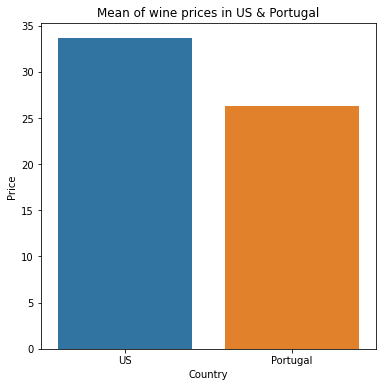

In [24]:
plt.figure(figsize = (6,6))
plt.title('Mean of wine prices in US & Portugal')
sns.barplot(x = 'Country', y="Price", data=z)

plt.show()

# We can partly check our second guess. Let's see how many wines are in dataset from particular country.
# Mean price of us and portugal

In [25]:
new.drop(new.loc[new['Country']=='US-France'].index, inplace=True)
new

,Unnamed: 0,Country,description,designation,Points,Price,Province,region_1,region_2,Variety,winery
0,0,US,This tremendous 100% varietal wine hails from ...,Martha's Vineyard,96,235.0,California,Napa Valley,Napa,Cabernet Sauvignon,Heitz
1,1,Spain,"Ripe aromas of fig, blackberry and cassis are ...",Carodorum Selección Especial Reserva,96,110.0,Northern Spain,Toro,NaN,Tinta de Toro,Bodega Carmen Rodríguez
2,2,US,Mac Watson honors the memory of a wine once ma...,Special Selected Late Harvest,96,90.0,California,Knights Valley,Sonoma,Sauvignon Blanc,Macauley
3,3,US,"This spent 20 months in 30% new French oak, an...",Reserve,96,65.0,Oregon,Willamette Valley,Willamette Valley,Pinot Noir,Ponzi
4,4,France,"This is the top wine from La Bégude, named aft...",La Brûlade,95,66.0,Provence,Bandol,NaN,Provence red blend,Domaine de la Bégude
...,...,...,...,...,...,...,...,...,...,...,...
150925,150925,Italy,Many people feel Fiano represents southern Ita...,NaN,91,20.0,Southern Italy,Fiano di Avellino,NaN,White Blend,Feudi di San Gregorio
150926,150926,France,"Offers an intriguing nose with ginger, lime an...",Cuvée Prestige,91,27.0,Champagne,Champagne,NaN,Champagne Blend,H.Germain
150927,150927,Italy,This classic example comes from a cru vineyard...,Terre di Dora,91,20.0,Southern Italy,Fiano di Avellino,NaN,White Blend,Terredora
150928,150928,France,"A perfect salmon shade, with scents of peaches...",Grand Brut Rosé,90,52.0,Champagne,Champagne,NaN,Champagne Blend,Gosset


In [26]:
new[new['Country'] == 'US']['Points'].mean()

87.81878936487331

In [27]:
t= new.groupby(['Country'])['Price','Points'].mean().reset_index().sort_values('Price',ascending=False)
t[['Country','Price']].head(n=10)

,Country,Price
14,England,47.500000
15,France,45.619885
19,Hungary,44.204348
26,Luxembourg,40.666667
17,Germany,39.011078
22,Italy,37.547913
7,Canada,34.628866
44,US,33.653808
21,Israel,31.304918
2,Australia,31.258480


In [28]:
g= new.groupby(['Country'])['Price','Points'].mean().reset_index().sort_values('Points',ascending=False)
g[['Country','Points']].head(n=10)

,Country,Points
14,England,92.888889
3,Austria,89.276742
15,France,88.925870
17,Germany,88.626427
22,Italy,88.413664
7,Canada,88.239796
37,Slovenia,88.234043
31,Morocco,88.166667
43,Turkey,88.096154
33,Portugal,88.057685


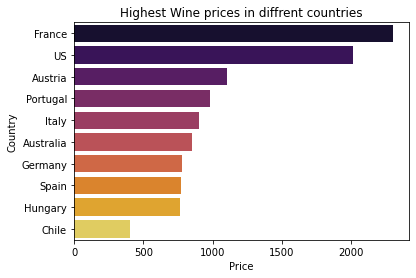

In [47]:
cnt = new.groupby(['Country'])['Price'].max().sort_values(ascending=False).to_frame()[:10]
sns.barplot(x = cnt['Price'], y = cnt.index, palette= 'inferno')
plt.title('Highest Wine prices in diffrent countries')
plt.savefig('save_as_a_png.png')

In [ ]:
# #Let's investigate which country have most expensive and most high rated wines. First of all we will sort it by price and then plot.
# # We can easily note, that the wines in England are the most expensive one.
# # I think the most impactful factor is much higher prices for all goods in this country. The highest mean of points came to England Based on our data let's try make some guesses why England wines are the best.

# # Most sommeliers come from England
# England provide information only for thier best wines
# They are simply the best :)
# We can partly check our second guess. Let's see how many wines are in dataset from particular country.

#To solve our 'problem' Important thing to investegate will be also price/quality factor.
# What can we see now? England was first on points ranking, but on points/quality ranking they are the second from the end. So, yeah, they provided information only for let's say 'premium' wines.


In [137]:
quality = g.sort_values('Quality Price Ratio', ascending= False)
quality.head(10)

,Country,Price,Points,Quality/Price,Quality Price Ratio
25,Lithuania,10.000000,84.250000,8.425000,8.425000
30,Montenegro,10.000000,82.000000,8.200000,8.200000
6,Bulgaria,11.545455,85.467532,7.402700,7.402700
4,Bosnia and Herzegovina,12.750000,84.750000,6.647059,6.647059
45,Ukraine,13.000000,84.600000,6.507692,6.507692
20,India,13.875000,87.625000,6.315315,6.315315
39,South Korea,13.500000,81.500000,6.037037,6.037037
11,Cyprus,15.483871,85.870968,5.545833,5.545833
27,Macedonia,15.312500,84.812500,5.538776,5.538776
29,Moldova,15.366197,84.718310,5.513291,5.513291


In [180]:
ratio = g.loc[g['Country'].isin(['US','France', 'Italy', 'England', 'Portugal'])]
k=ratio.sort_values('Quality Price Ratio', ascending= True)
k

,Country,Price,Points,Quality/Price,Quality Price Ratio
15,France,45.619885,88.925870,1.949279,1.949279
14,England,47.500000,92.888889,1.955556,1.955556
22,Italy,37.547913,88.413664,2.354689,2.354689
44,US,33.653808,87.818789,2.609476,2.609476
33,Portugal,26.332615,88.057685,3.344054,3.344054


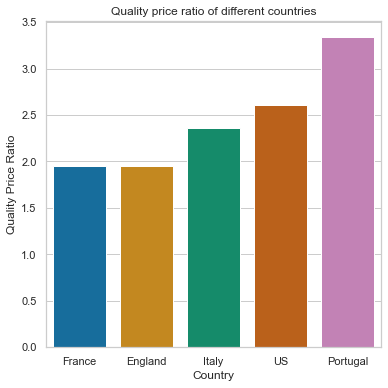

In [182]:
plt.figure(figsize = (6,6))
plt.title('Quality price ratio of different countries')
sns.barplot(x = 'Country', y="Quality Price Ratio", data=k, palette= 'colorblind')

plt.show()


In [132]:
new['Variety'].value_counts()

Chardonnay                  14482
Pinot Noir                  14291
Cabernet Sauvignon          12800
Red Blend                   10062
Bordeaux-style Red Blend     7347
                            ...  
Durello                         1
Carignan-Syrah                  1
Erbaluce                        1
Azal                            1
Rabigato                        1
Name: Variety, Length: 632, dtype: int64

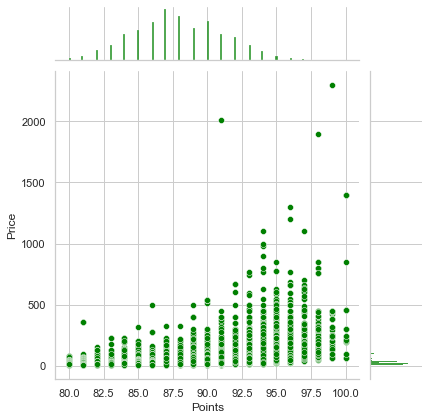

In [161]:
sns.jointplot( x = new['Points'],y = new['Price'],color='green');

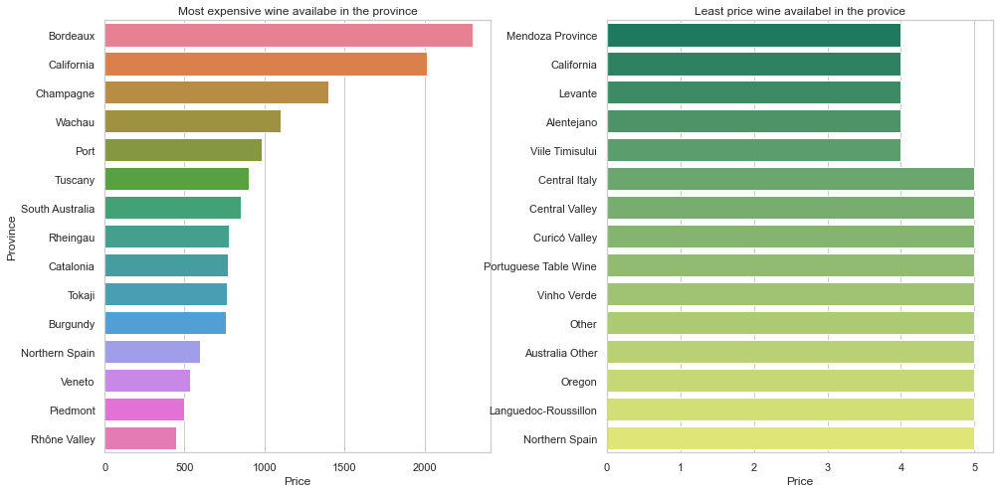

In [186]:
fig,ax = plt.subplots(1,2,figsize=(16,8))
ax1,ax2 = ax.flatten()

cnt = new.groupby(['Province'])['Price'].max().sort_values(ascending=False).to_frame()[:15]
sns.barplot(x = cnt['Price'], y = cnt.index, palette= 'husl',ax=ax1)
ax1.set_title('Most expensive wine availabe in the province')
ax1.set_ylabel('Province')
ax1.set_xlabel('Price')
cnt = new.groupby(['Province'])['Price'].min().sort_values(ascending=True).to_frame()[:15]
sns.barplot(x = cnt['Price'], y = cnt.index, palette = 'summer',ax=ax2)
ax2.set_title('Least price wine availabel in the provice')
ax2.set_ylabel('')
ax2.set_xlabel('Price')
plt.subplots_adjust(wspace=0.3);